In [16]:
"""

Use the same 10,0000-observation sample that you used in the previous lesson. To complete this assessment, 
submit a link to a Jupyter Notebook containing your solutions to the tasks outlined below. 
You can also take a look at these example solutions.

Load the dataset and conduct any necessary preprocessing, such as normalizing the data.
Apply t-SNE to the data by setting n_components=2.
Using the two-dimensional t-SNE representation, draw a graph of the data by coloring and labeling the data points as you did in the lesson.
Do you think that the t-SNE solution is satisfactory? Can you easily distinguish between the different classes? 
Which algorithm produced better results, t-SNE or the PCA that you applied in the previous lesson's assessment?
Now, play with the different perplexity values and apply t-SNE for each of them. Which perplexity value is best in terms of the two-dimensional representation clarity?

"""

"\n\nUse the same 10,0000-observation sample that you used in the previous lesson. To complete this assessment, \nsubmit a link to a Jupyter Notebook containing your solutions to the tasks outlined below. \nYou can also take a look at these example solutions.\n\nLoad the dataset and conduct any necessary preprocessing, such as normalizing the data.\nApply t-SNE to the data by setting n_components=2.\nUsing the two-dimensional t-SNE representation, draw a graph of the data by coloring and labeling the data points as you did in the lesson.\nDo you think that the t-SNE solution is satisfactory? Can you easily distinguish between the different classes? \nWhich algorithm produced better results, t-SNE or the PCA that you applied in the previous lesson's assessment?\nNow, play with the different perplexity values and apply t-SNE for each of them. Which perplexity value is best in terms of the two-dimensional representation clarity?\n\n"

In [17]:
# Load the dataset and make your preprocessing like normalizing the data.

import numpy as np
import time
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_openml
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

In [18]:

mnist = fetch_openml('Fashion-MNIST', version=1, cache=True)

In [19]:
np.random.seed(123)

indices = np.random.choice(len(mnist.data), 10000)
X = mnist.data.loc[indices] / 255.0
y = mnist.target.loc[indices]

print(X.shape, y.shape)

(10000, 784) (10000,)


In [20]:
# Apply t-SNE to the data by setting n_components=2.

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.010s...


C:\Users\rakim\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\rakim\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 10000 samples in 2.510s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.836339
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.943161
[t-SNE] KL divergence after 300 iterations: 2.528135
t-SNE done! Time elapsed: 11.128216981887817 seconds


In [21]:
# Using the two-dimensional t-SNE representation, draw a graph of the data by coloring 
# and labeling the data points as we did in the checkpoint.

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(tsne_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], str(y.iloc[i]),
             color=colours[int(y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

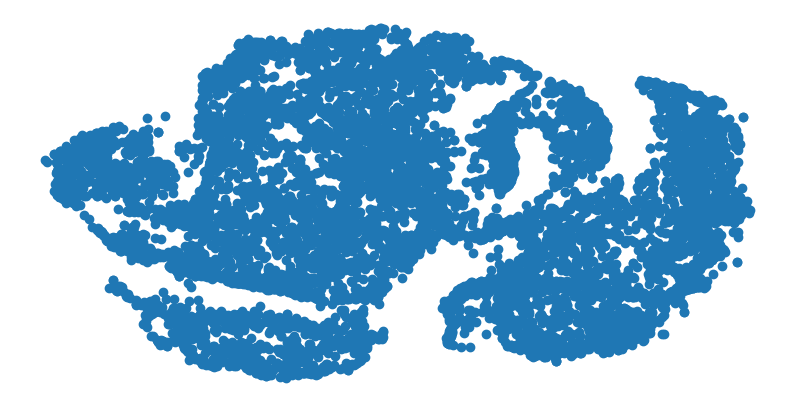

In [22]:
# Do you think t-SNE solution is satisfactory? 
# Can you distinguish between different classes easily? Which one has done a better job: t-SNE or the PCA you applied in the assignment of the previous checkpoint?

plt.figure(figsize=(10,5))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

C:\Users\rakim\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\rakim\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.010s...
[t-SNE] Computed neighbors for 10000 samples in 2.433s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.410901
[t-SNE] KL divergence after 250 iterations with early exaggeration: 87.178009
[t-SNE] KL divergence after 300 iterations: 3.494850


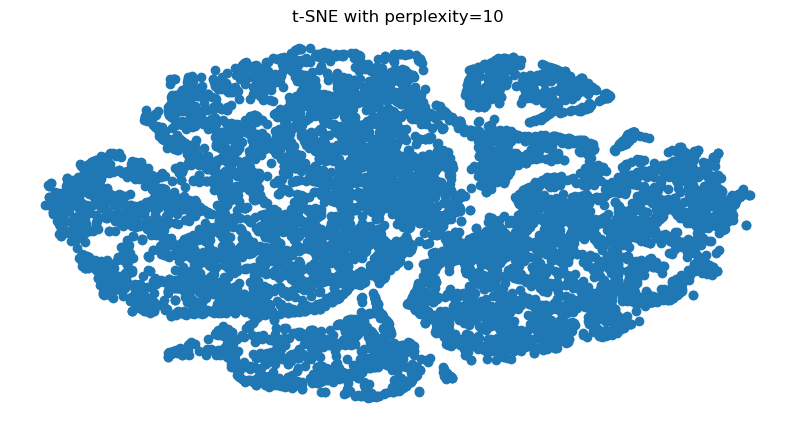

In [23]:
# Now, play with the different perplexity values and apply t-SNE for each of them. Which perplexity 
# value is the best one in terms of the two-dimensional representation clarity?

tsne = TSNE(n_components=2, verbose=1, perplexity=10, n_iter=300)
tsne_results = tsne.fit_transform(X)

plt.figure(figsize=(10,5))
plt.title("t-SNE with perplexity=10")
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [ ]:
# The t-SNE implementation for the M-NIST dataset is better than PCA. 
# But results are still below par for unlabeled and uncolored plots.
